# Percentiles

Assessment of model percentiles 99th, 99.5th, and 99.9th (1st, 0.5th and 0.1st for Tasmin)

In [1]:
import warnings
warnings.filterwarnings('ignore')
import logging
logging.basicConfig(level=logging.CRITICAL)
import sys
import numpy as np
import matplotlib.pyplot as plt
import cmocean
import cartopy.crs as ccrs

#sys.path.append('/g/data/xv83/users/at2708/bias_adjustment/evaluation/npcp/results')
import utils

ERROR 1: PROJ: proj_create_from_database: Open of /g/data/xv83/dbi599/miniconda3/envs/npcp/share/proj failed


In [2]:
def calc_perc(da, var):
    """Calculate the averaged 5-year maximum (minimum for Tasmin)"""
    
    if var == 'pr' or var == 'tasmax':
        percentiles_99 = da.chunk({'time': -1}).quantile(0.99, dim='time')
        percentiles_995 = da.chunk({'time': -1}).quantile(0.995, dim='time')
        percentiles_999 = da.chunk({'time': -1}).quantile(0.999, dim='time')
        return percentiles_99, percentiles_995, percentiles_999
    else:
        percentiles_01 = da.chunk({'time': -1}).quantile(0.01, dim='time')
        percentiles_005 = da.chunk({'time': -1}).quantile(0.005, dim='time')
        percentiles_001 = da.chunk({'time': -1}).quantile(0.001, dim='time')       
        return percentiles_01, percentiles_005, percentiles_001
     

In [3]:
# Data collection and processing

def get_assessment_time_bounds(gcm, task):
    """Get assessment time bounds for given GCM/task combination"""

    if gcm == 'ECMWF-ERA5':
        start_date = '2000-01-01' if task == 'xvalidation' else '1980-01-01'
    else:
        start_date = '1990-01-01' if task == 'xvalidation' else '1980-01-01' 
    end_date = '2019-12-31'
    
    return start_date, end_date


def get_training_time_bounds(gcm):
    """Get xvalidation training time bounds for given GCM/task combination"""

    if gcm == 'ECMWF-ERA5':
        start_date = '1980-01-01'
        end_date = '1999-12-31'
    else:
        start_date = '1960-01-01' 
        end_date = '1989-12-31'
    
    return start_date, end_date


def get_obs_data(var, start_date, end_date):
    """Get obs data"""
    
    da_obs = utils.get_npcp_data(
        var,
        'observations',
        'AGCD',
        'raw',
        'task-reference',
        start_date,
        end_date,
    )
    
    return da_obs


def get_gcm_data(var, gcm, start_date, end_date):
    """Get reference/raw GCM data."""

    assert gcm in ['ECMWF-ERA5', 'CSIRO-ACCESS-ESM1-5', 'NCAR-CESM2', 'EC-Earth-Consortium-EC-Earth3']
    try:
        da_gcm = utils.get_npcp_data(var, gcm, 'GCM', 'raw', 'task-reference', start_date, end_date)
        return da_gcm
    except OSError:
        print(f"Warning: GCM raw data for {gcm} is missing for the period {start_date} to {end_date}.")
        return None

    

def get_rcm_data(var, gcm, rcm, start_date, end_date):
    """Get reference/raw RCM data"""
    
    assert gcm in ['ECMWF-ERA5', 'CSIRO-ACCESS-ESM1-5', 'NCAR-CESM2', 'EC-Earth-Consortium-EC-Earth3']
    assert rcm in ['BOM-BARPA-R', 'CSIRO-CCAM-2203', 'UQ-DES-CCAM-2105']

    try:
        da_rcm = utils.get_npcp_data(var, gcm, rcm, 'raw', 'task-reference', start_date, end_date)   
        return da_rcm
    except OSError:
        print(f"Warning: RCM raw data for {gcm}/{rcm} is missing for the period {start_date} to {end_date}.")
        return None

def get_bias_corrected_rcm_data(var, gcm, rcm, task, start_date, end_date):
    """Get bias corrected RCM data"""

    assert gcm in ['ECMWF-ERA5', 'CSIRO-ACCESS-ESM1-5', 'NCAR-CESM2', 'EC-Earth-Consortium-EC-Earth3']
    assert rcm in ['BOM-BARPA-R', 'CSIRO-CCAM-2203', 'UQ-DES-CCAM-2105']
    assert task in ['historical', 'xvalidation']
    
    bc_methods = ['ecdfm', 'qme', 'mbcn', 'mrnbc']
    # TODO: Add additional bias correction methods as data becomes available 
    if task == 'xvalidation':
        bc_methods.append('qdc')

    da_dict = {}
    for bc in bc_methods:
        try:
            da = utils.get_npcp_data(var, gcm, rcm, bc, f'task-{task}', start_date, end_date)
            da_dict[bc] = da
        except OSError:
            print(f"Warning: Bias corrected RCM data for {gcm}/{rcm} using {bc} is missing for the period {start_date} to {end_date}.")
            da_dict[bc] = None

    return da_dict


def get_bias_corrected_gcm_data(var, gcm, task, start_date, end_date):
    """Get bias corrected GCM data"""

    assert gcm in ['ECMWF-ERA5', 'CSIRO-ACCESS-ESM1-5', 'NCAR-CESM2', 'EC-Earth-Consortium-EC-Earth3']
    assert task in ['historical', 'xvalidation']
    
    bc_methods = ['ecdfm']
    if task == 'xvalidation':
        bc_methods.append('qdc')

    da_dict = {}
    for bc in bc_methods:
        try:
            da = utils.get_npcp_data(var, gcm, 'GCM', bc, f'task-{task}', start_date, end_date)
            da_dict[bc] = da
        except OSError:
            print(f"Warning: Bias corrected GCM data for {gcm} using {bc} is missing for the period {start_date} to {end_date}.")
            da_dict[bc] = None

    return da_dict

In [4]:
def plot_bias(ax, da_obs, da_model, var, cmap, levels, model_name, percentile, ob_fractions=None):
    """Plot the mean bias for a particular model"""
    
    perc1_obs, perc2_obs, perc3_obs = calc_perc(da_obs, var)  
    perc1_model, perc2_model, perc3_model = calc_perc(da_model, var) 

    if (var == 'pr' or var == 'tasmax') and percentile == '99th':
        bias = perc1_model - perc1_obs #99th p.
    elif (var == 'pr' or var == 'tasmax') and percentile  == '99.5th':
        bias = perc2_model - perc2_obs #99.5th p.
    elif (var == 'pr' or var == 'tasmax') and percentile  == '99.9th':
        bias = perc3_model - perc3_obs #99.9th p.
    elif var == 'tasmin' and percentile == '1st':
        bias = perc1_model - perc1_obs #1st p.
    elif var == 'tasmin' and percentile == '0.5th':
        bias = perc2_model - perc2_obs #0.5th p.
    elif var == 'tasmin' and percentile == '0.1st':
        bias = perc3_model - perc3_obs #0.1st p.
    else:
        print('Invalid percentile value or invalid variable')
        return
    bias = utils.clip_data(bias, utils.get_aus_shape())
    if ob_fractions is not None:
        bias = utils.mask_by_pr_ob_fraction(bias, ob_fractions, threshold=0.9) 
    mae = np.nanmean(np.abs(bias))    
    units = 'mm/day' if var == 'pr' else da_model.attrs['units']
    
    im = bias.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        levels=levels,
        extend='both', 
        add_colorbar=False
    ) #cbar_kwargs={'label': units},
    ax.set_title(model_name)
    ax.coastlines()
    cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.04)
    cbar.ax.tick_params(labelsize=14)  
    cbar.set_label(units, fontsize=14) 
    ax.text(0.02, 0.02, f'MAE: {mae:.2f} {units}', transform=ax.transAxes, fontsize=10)

In [5]:
def plot_comparison(
    da_obs,
    da_gcm,
    da_rcm,
    gcm_bc_dict,
    rcm_bc_dict,
    da_training_obs,
    var,
    gcm,
    rcm,
    task,
    cmap,
    levels,    
    outfile=None,
):
    """Plot the complete comparison"""

    if var == 'pr' or var == 'tasmax':
        percentiles = ['99th', '99.5th', '99.9th']  
        ob_fractions = utils.get_pr_weights(gcm, task) if var == 'pr' else None
    elif var == 'tasmin':
        percentiles = ['1st', '0.5th', '0.1st']
        ob_fractions = None
    else:
        print('Invalid variable')

    for row, percentile in enumerate(percentiles):

        ncols = 5 if task == 'xvalidation' else 3
        nrows = 3
        plot_nums = np.arange(1, (ncols * nrows) + 1)
        if var == 'pr':
            ob_fractions = utils.get_pr_weights(gcm, task)
        else:
            ob_fractions = None
        
        fig = plt.figure(figsize=[7 * ncols, 5 * nrows])



        # GCM univariate bias correction
        plot_index = 0
        if da_gcm is not None:
            ax_gcm1 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            plot_bias(
                ax_gcm1, da_obs, da_gcm, var, cmap, levels, f'{gcm} ({percentile})', percentile, ob_fractions=ob_fractions,
            )
        plot_index = plot_index + 1
        if 'ecdfm' in gcm_bc_dict and gcm_bc_dict['ecdfm'] is not None:
            ax_gcm2 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            plot_bias(
                ax_gcm2, da_obs, gcm_bc_dict['ecdfm'], var, cmap, levels, f'{gcm} (ecdfm) ({percentile})', percentile, ob_fractions=ob_fractions,
            )
        
        plot_index = plot_index + 1   # blank space
    
    
        if task == 'xvalidation':
            plot_index = plot_index + 1
            if 'qdc' in gcm_bc_dict and gcm_bc_dict['qdc'] is not None:
                ax_gcm4 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
                plot_bias(
                    ax_gcm4, da_obs, gcm_bc_dict['qdc'], var, cmap, levels, f'{gcm} (qdc) ({percentile})', percentile, ob_fractions=ob_fractions,
                )
    
            plot_index = plot_index + 1
    
        # RCM univariate bias correction
        plot_index = plot_index + 1
        if da_rcm is not None: 
            ax_urcm1 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            plot_bias(
                ax_urcm1, da_obs, da_rcm, var, cmap, levels, f'{rcm} (raw) ({percentile})', percentile, ob_fractions=ob_fractions,
            )
        plot_index = plot_index + 1
    
        if 'ecdfm' in rcm_bc_dict and rcm_bc_dict['ecdfm'] is not None:
            ax_urcm2 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            plot_bias(
                ax_urcm2, da_obs, rcm_bc_dict['ecdfm'], var, cmap, levels, f'{rcm} (ecdfm) ({percentile})', percentile, ob_fractions=ob_fractions,
            )   
        plot_index = plot_index + 1
    
        if 'qme' in rcm_bc_dict and rcm_bc_dict['qme'] is not None:
            ax_urcm3 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            plot_bias(
                ax_urcm3, da_obs, rcm_bc_dict['qme'], var, cmap, levels, f'{rcm} (qme) ({percentile})', percentile, ob_fractions=ob_fractions,
            )
        if task == 'xvalidation':
            plot_index = plot_index + 1
            if 'qdc' in rcm_bc_dict and rcm_bc_dict['qdc'] is not None:        
                ax_urcm4 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
                plot_bias(
                    ax_urcm4, da_obs, rcm_bc_dict['qdc'], var, cmap, levels, f'{rcm} (qdc) ({percentile})', percentile, ob_fractions=ob_fractions,
                )
            
            plot_index = plot_index + 1
            ax_urcm5 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            plot_bias(
                ax_urcm5, da_obs, da_training_obs, var, cmap, levels, f'AGCD (training data) ({percentile})', percentile, ob_fractions=ob_fractions,
            )
    
    
        # RCM multivariate bias correction
        plot_index = plot_index + 1   # blank space
        
        plot_index = plot_index + 1
    
        if 'mbcn' in rcm_bc_dict and rcm_bc_dict['mbcn'] is not None:    
            ax_mrcm1 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            plot_bias(
                ax_mrcm1, da_obs, rcm_bc_dict['mbcn'], var, cmap, levels, f'{rcm} (mbcn) ({percentile})', percentile, ob_fractions=ob_fractions,
            )
        
        plot_index = plot_index + 1
        if 'mrnbc' in rcm_bc_dict and rcm_bc_dict['mrnbc'] is not None:            
            ax_mrcm2 = fig.add_subplot(nrows, ncols, plot_nums[plot_index], projection=ccrs.PlateCarree())
            plot_bias(
                ax_mrcm2, da_obs, rcm_bc_dict['mrnbc'], var, cmap, levels, f'{rcm} (mrnbc) ({percentile})', percentile, ob_fractions=ob_fractions,
            )

        if row == 0:
            if gcm == 'ECMWF-ERA5':
                start_year = '2000' if task == 'xvalidation' else '1980'
            else:
                start_year = '1990' if task == 'xvalidation' else '1980'
            
            plt.suptitle(f'Bias (model minus obs) in the {start_year}-2019 {name}', fontsize='x-large')
    if outfile:
        print(outfile)
        plt.savefig(outfile, dpi=300, bbox_inches='tight')
    plt.show()



In [6]:
def plot_rcm(
    da_obs,
    da_gcm,
    gcm_bc_dict,
    variable,
    gcm,
    rcm,
    task,
    start_date,
    end_date,
    da_training_obs=None,
    save_outfile=False,
):
    """Generate plots for one RCM/GCM combination"""
    
    da_rcm = get_rcm_data(variable, gcm, rcm, start_date, end_date)
    rcm_bc_dict = get_bias_corrected_rcm_data(variable, gcm, rcm, task, start_date, end_date)
    if save_outfile:
        outfile = f'{variable}_extreme-bias_task-{task}_{gcm}_{rcm}.png'
    else:
        outfile = None
    
    plot_comparison(
        da_obs,
        da_gcm,
        da_rcm,
        gcm_bc_dict,
        rcm_bc_dict,
        da_training_obs,
        variable,
        gcm,
        rcm,
        task,
        cmap,
        levels,       
        outfile=outfile,
    )

# task-historical
Bias corrected data for the 1980-2019 period, using 1980-2019 as a training period.

In [7]:
variable = 'tasmin'
name = 'daily minimum near-surface air temperature'
units = 'C'
levels = np.arange(-3.75, 3.76, 0.5)
cmap = 'RdBu_r'

### ACCESS-ESM1-5

In [8]:
gcm = 'CSIRO-ACCESS-ESM1-5'
task = 'historical'
start_date, end_date = get_assessment_time_bounds(gcm, task)
da_obs = get_obs_data(variable, start_date, end_date)
da_gcm = get_gcm_data(variable, gcm, start_date, end_date)
gcm_bc_dict = get_bias_corrected_gcm_data(variable, gcm, task, start_date, end_date)

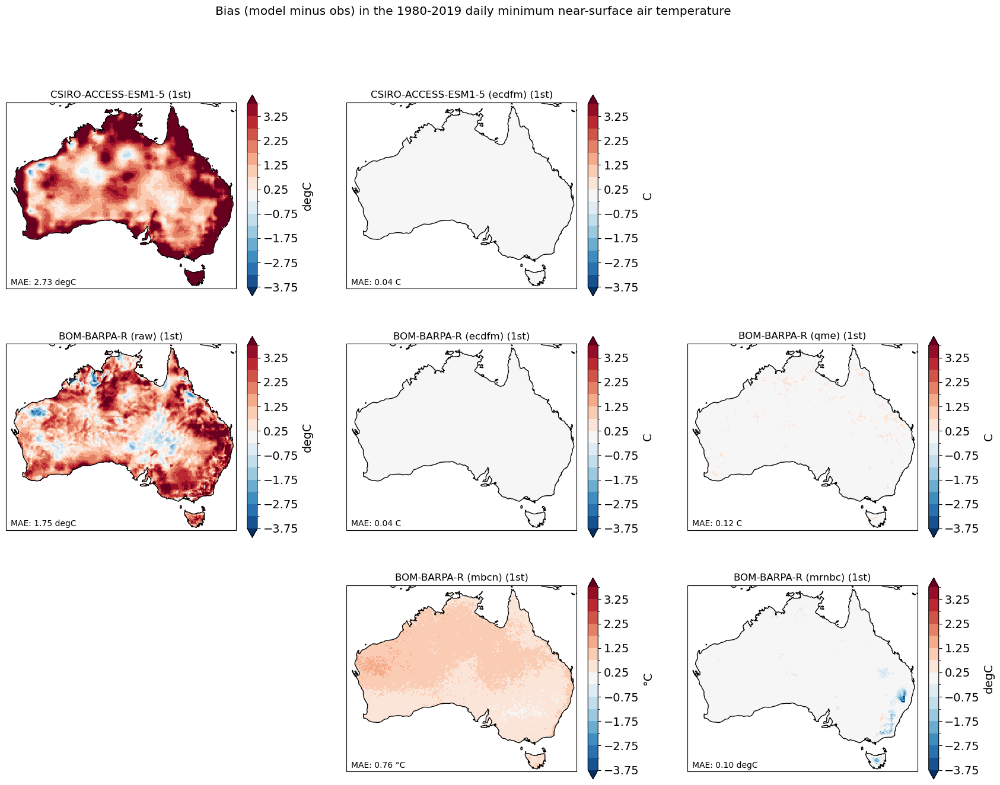

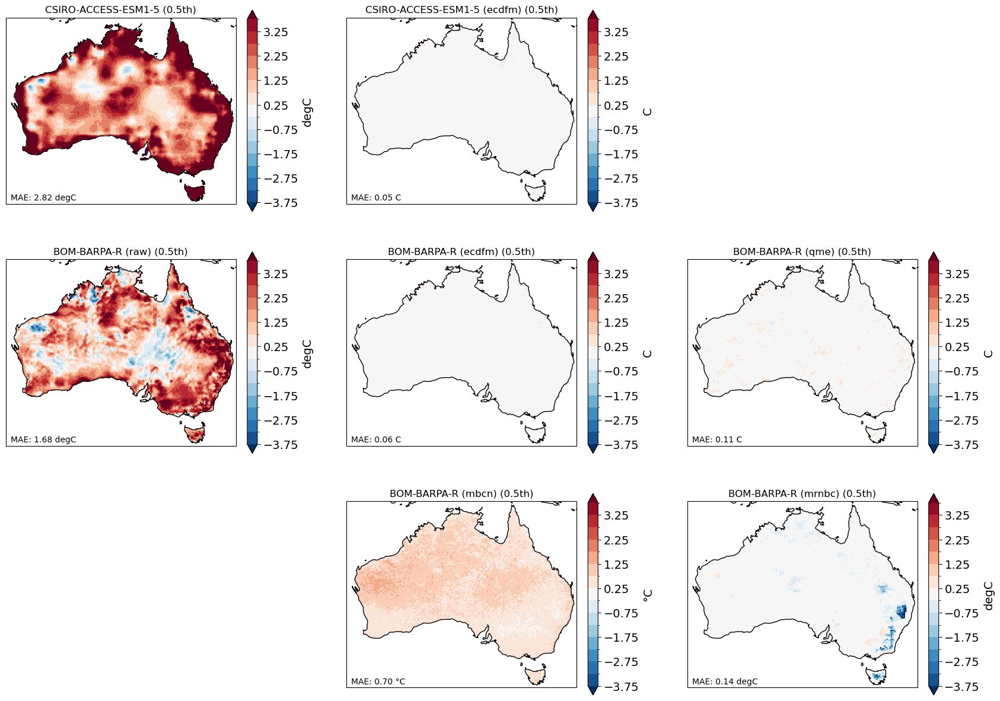

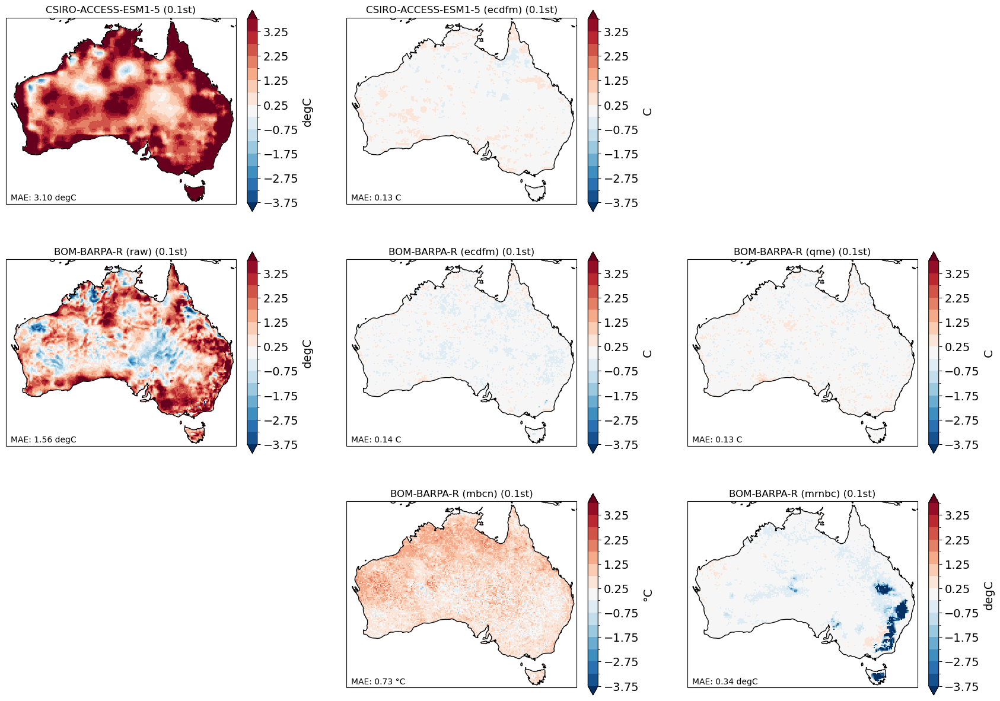

In [9]:
rcm = 'BOM-BARPA-R'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date, save_outfile=False)

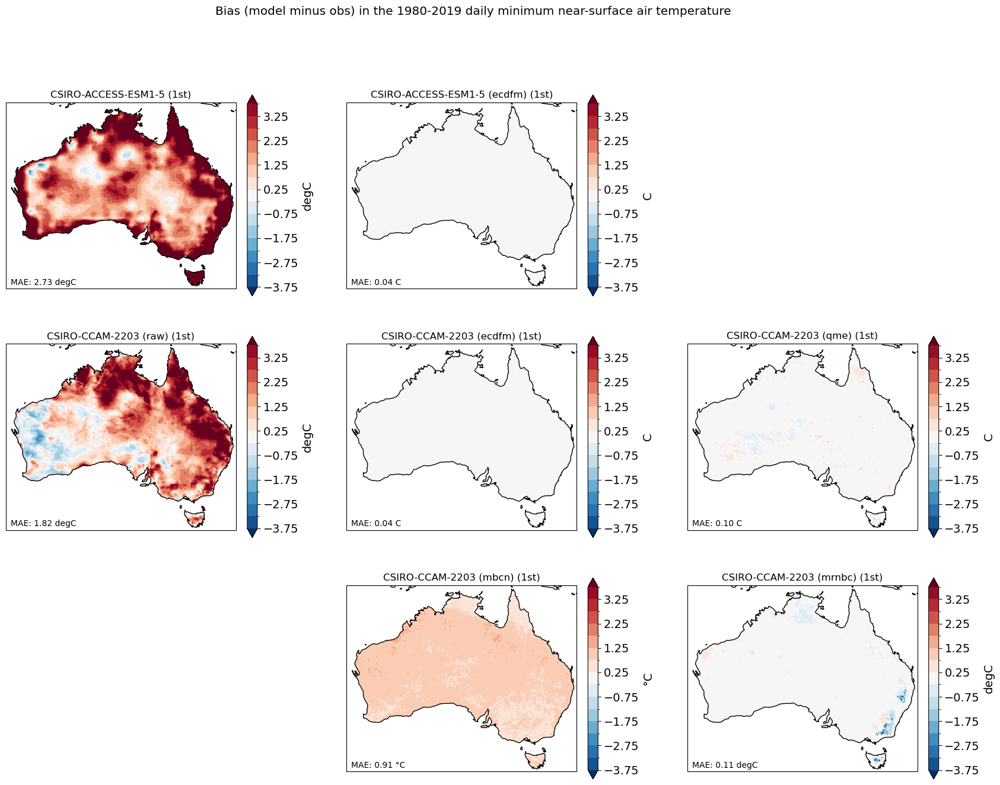

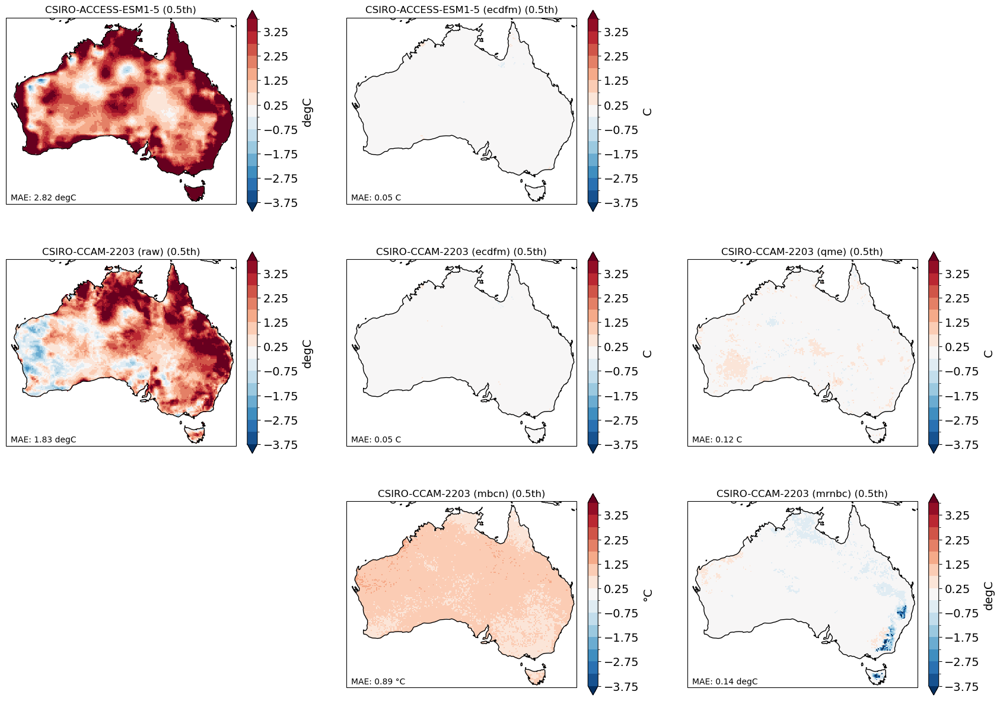

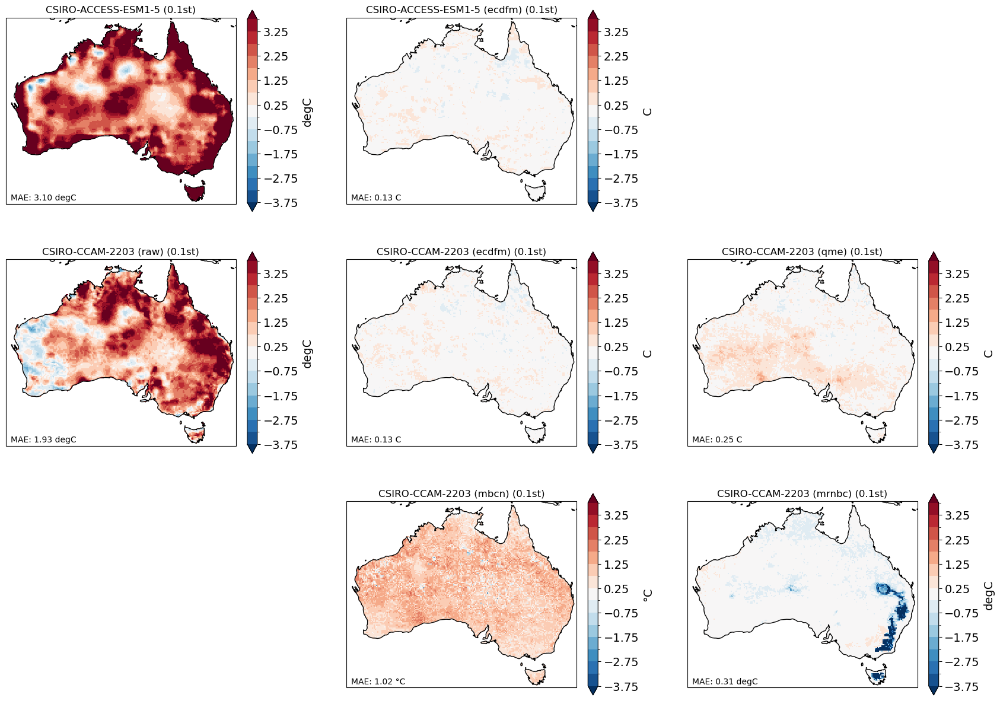

In [10]:
rcm = 'CSIRO-CCAM-2203'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date)

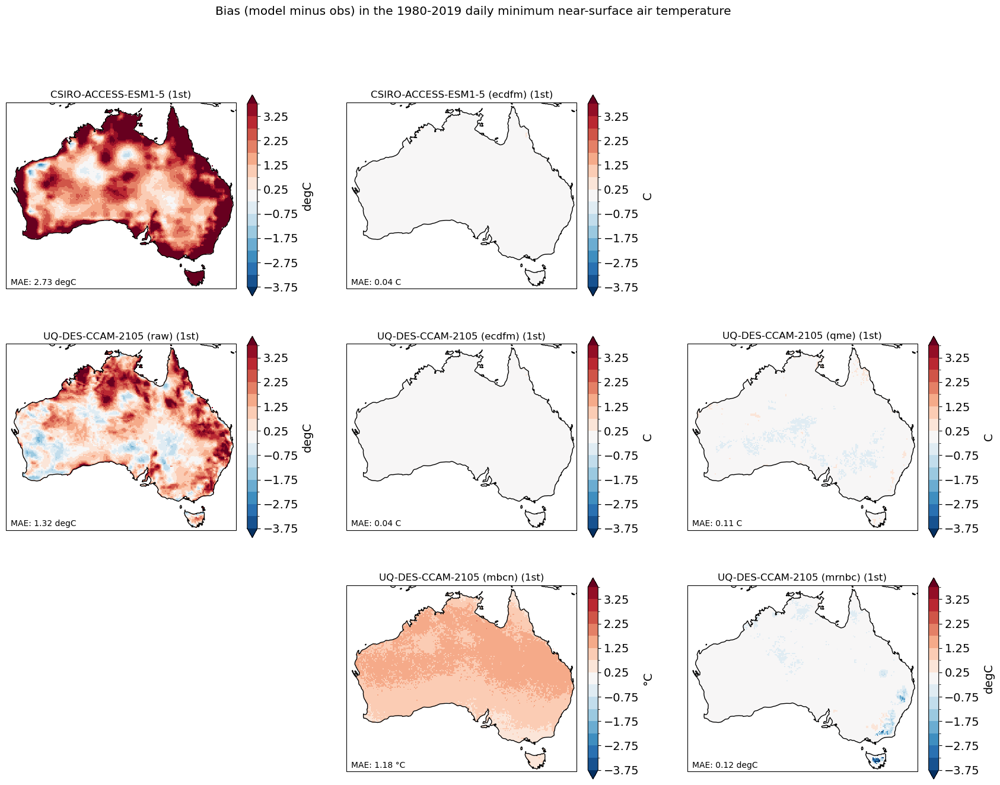

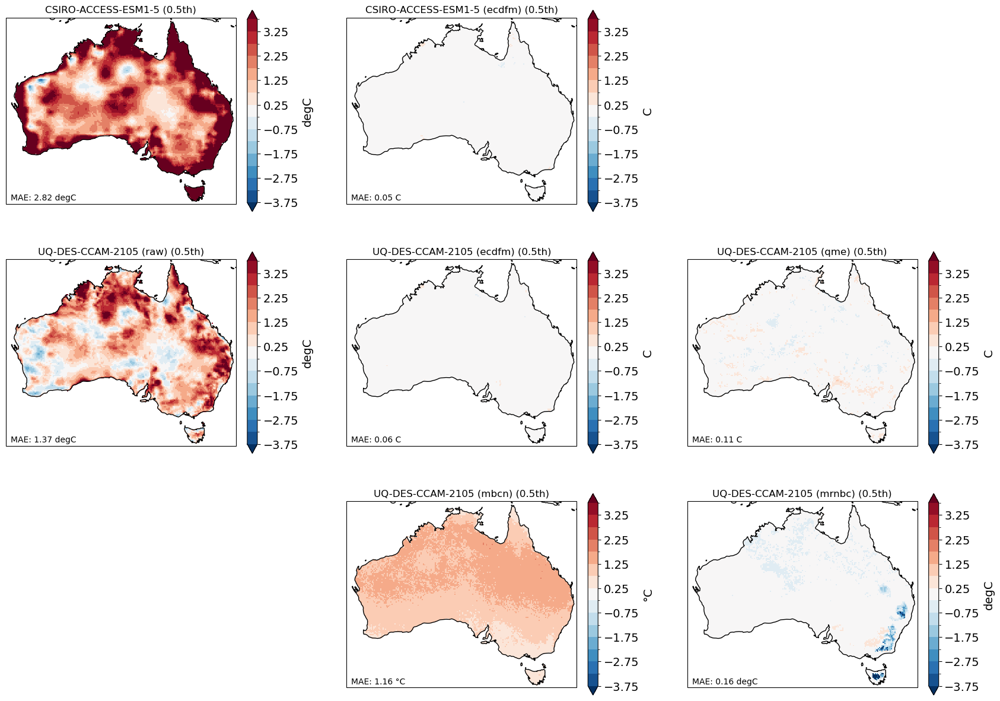

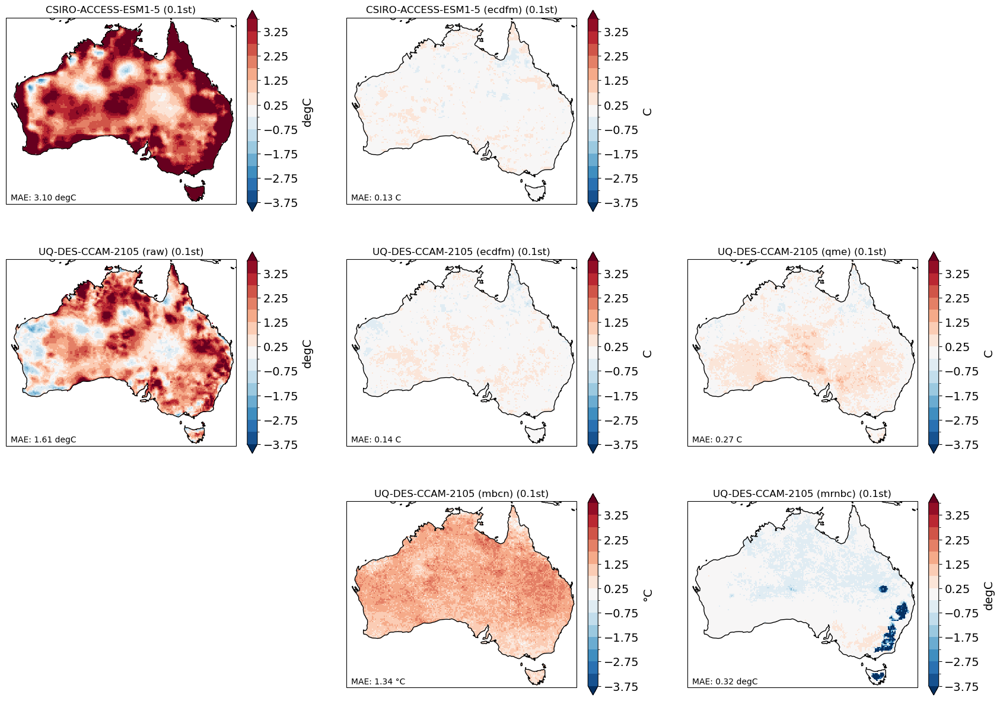

In [11]:
rcm = 'UQ-DES-CCAM-2105'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date)

#### CESM2

In [12]:
gcm = 'NCAR-CESM2'
task = 'historical'
start_date, end_date = get_assessment_time_bounds(gcm, task)
da_obs = get_obs_data(variable, start_date, end_date)
da_gcm = get_gcm_data(variable, gcm, start_date, end_date)
gcm_bc_dict = get_bias_corrected_gcm_data(variable, gcm, task, start_date, end_date)

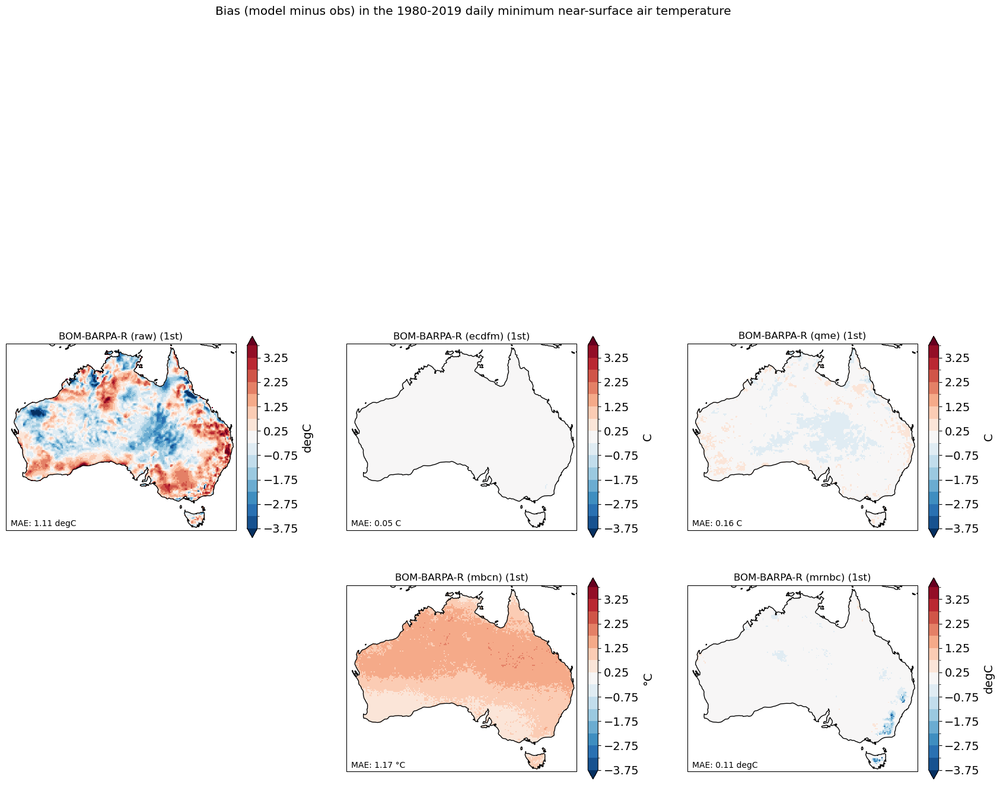

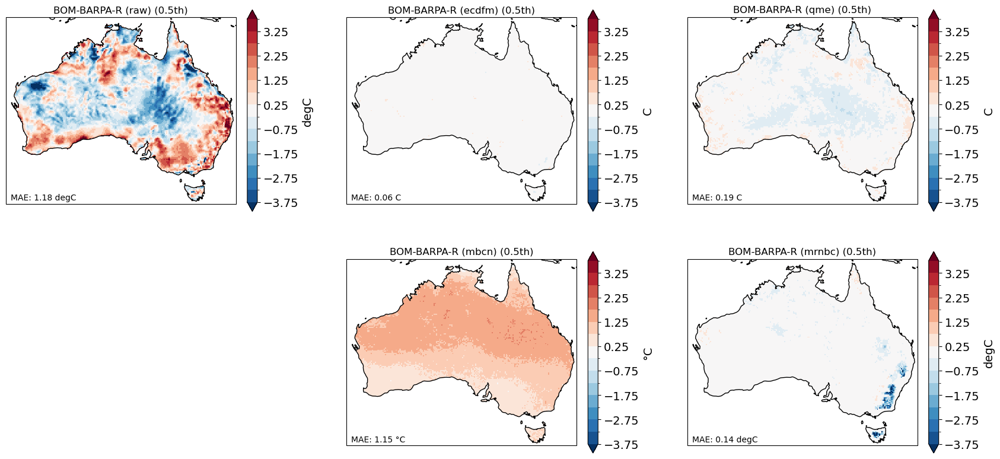

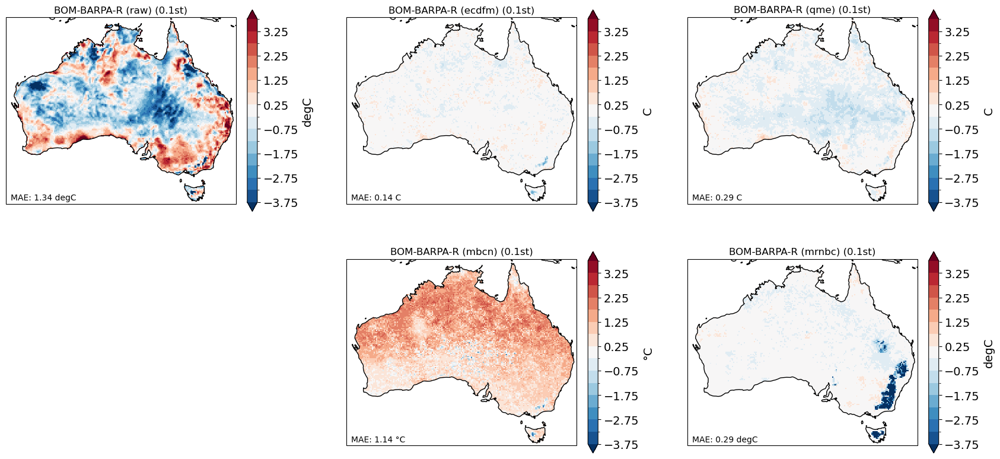

In [13]:
rcm = 'BOM-BARPA-R'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date, save_outfile=False)

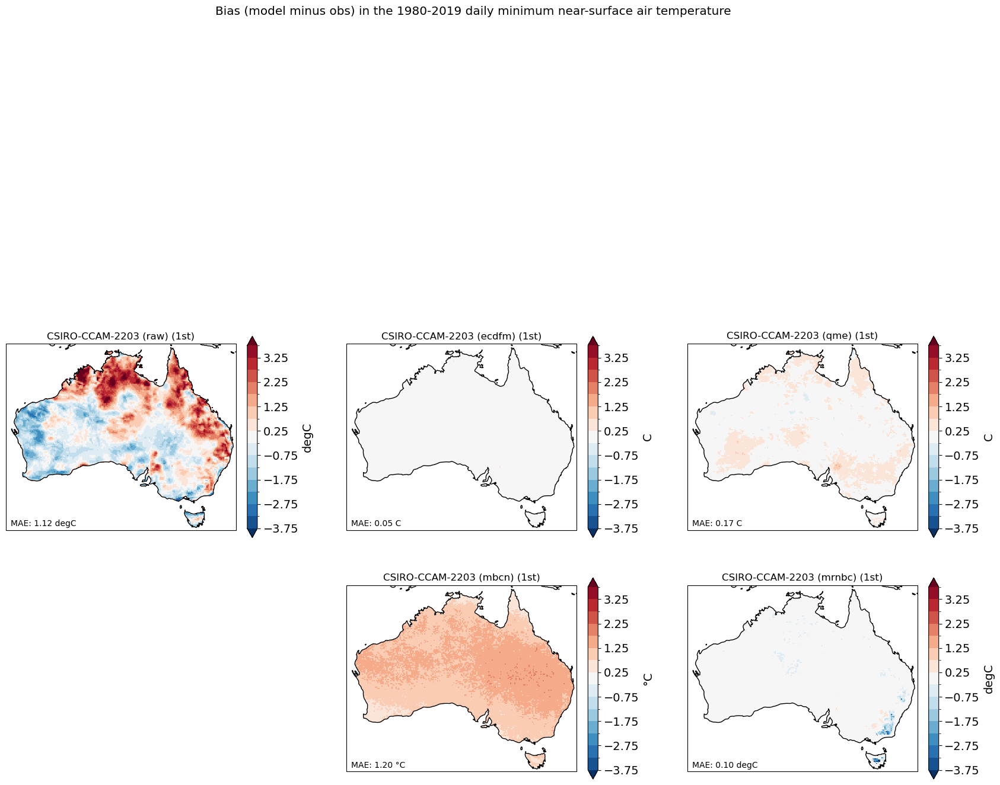

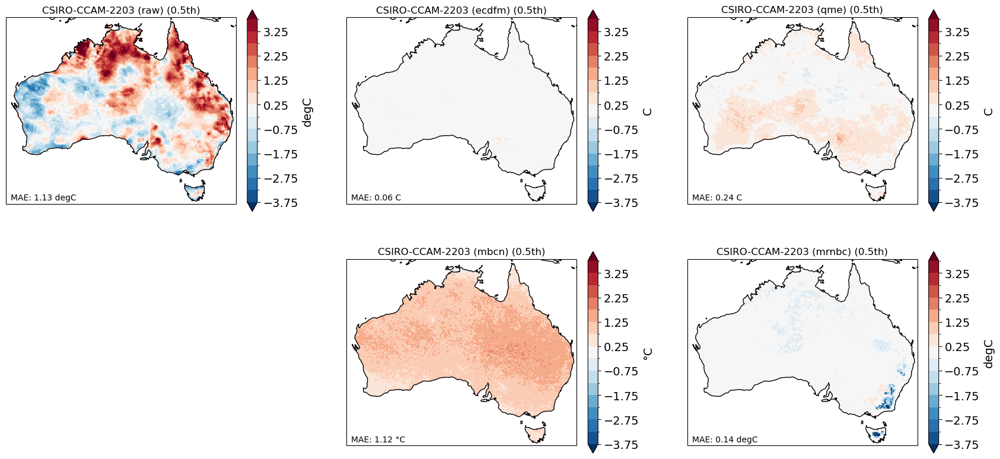

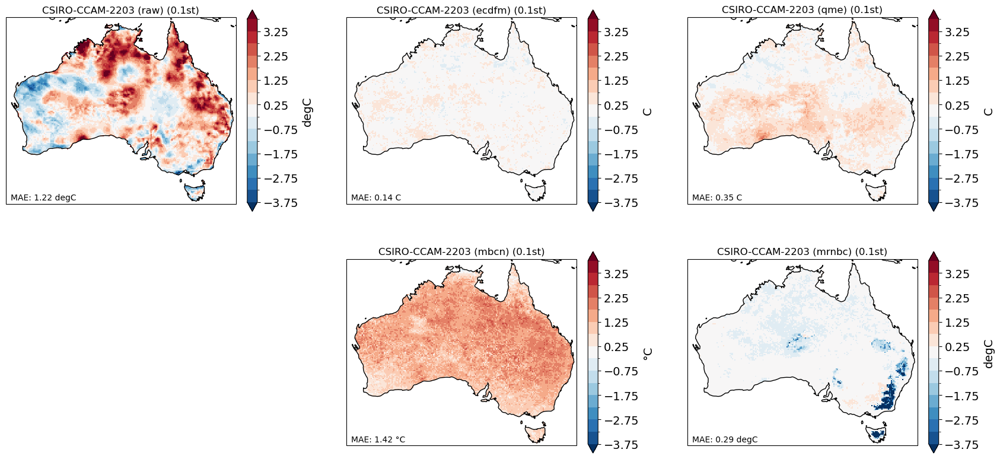

In [14]:
rcm = 'CSIRO-CCAM-2203'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date)

#### EC-Earth3

In [15]:
gcm = 'EC-Earth-Consortium-EC-Earth3'
task = 'historical'
start_date, end_date = get_assessment_time_bounds(gcm, task)
da_obs = get_obs_data(variable, start_date, end_date)
da_gcm = get_gcm_data(variable, gcm, start_date, end_date)
gcm_bc_dict = get_bias_corrected_gcm_data(variable, gcm, task, start_date, end_date)

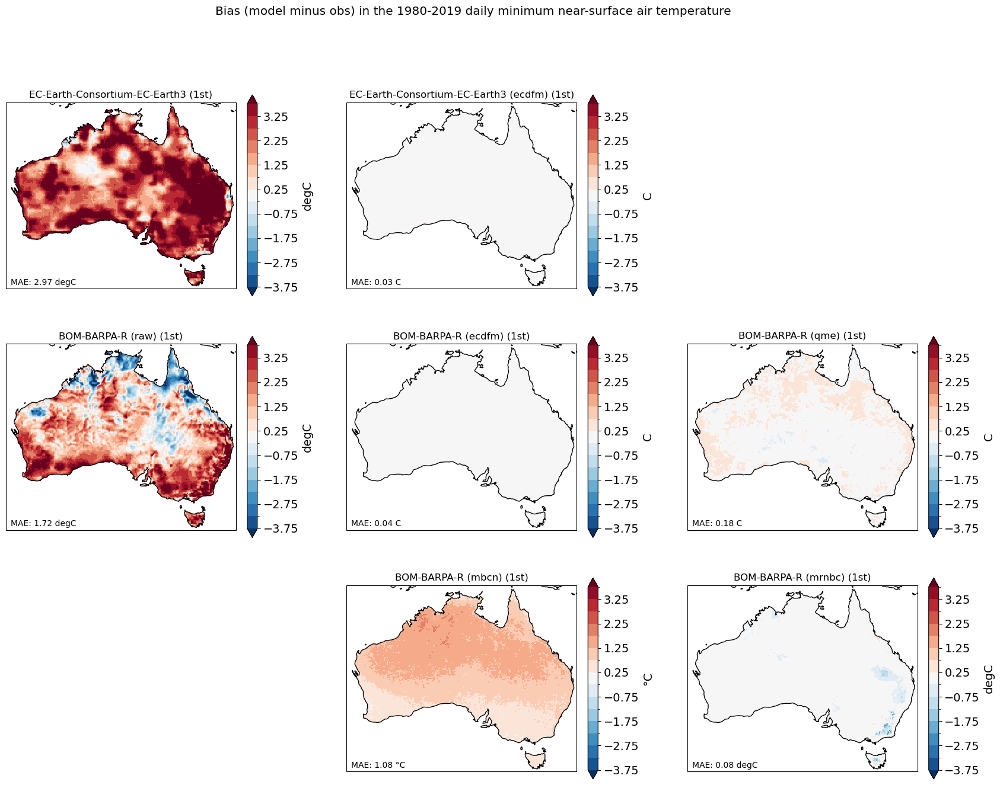

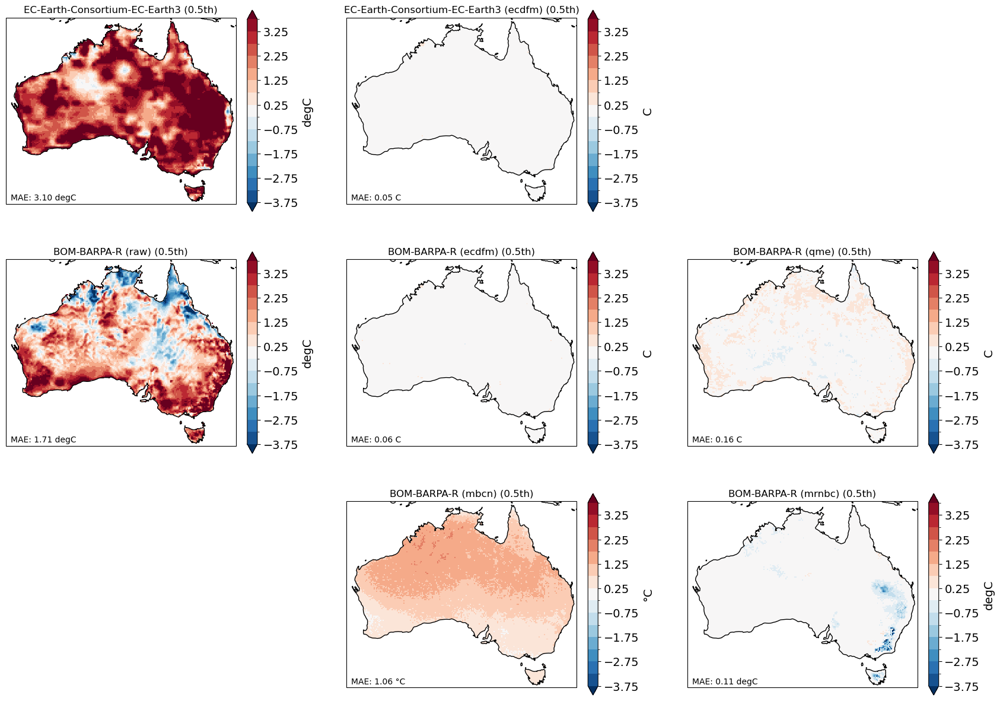

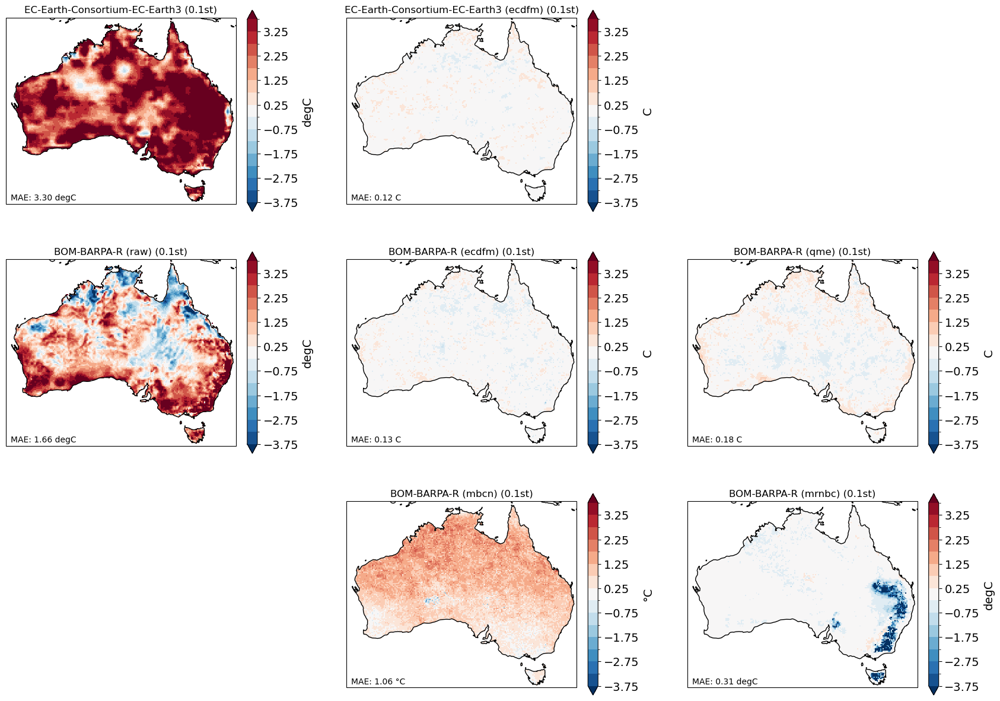

In [16]:
rcm = 'BOM-BARPA-R'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date, save_outfile=False)

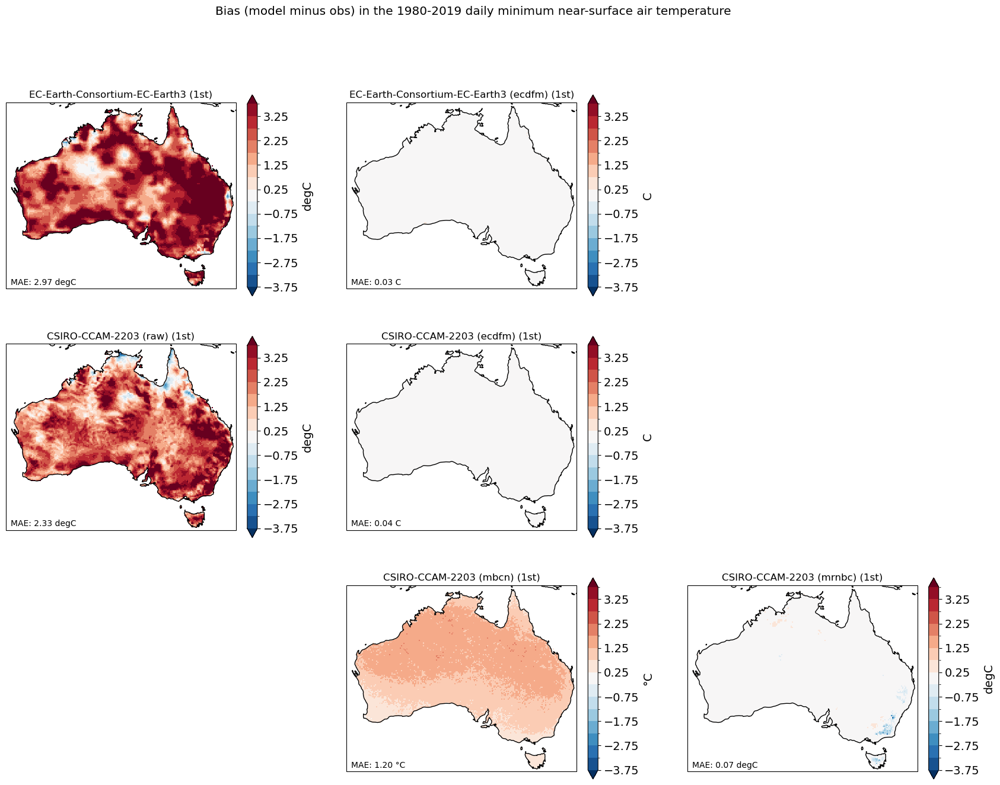

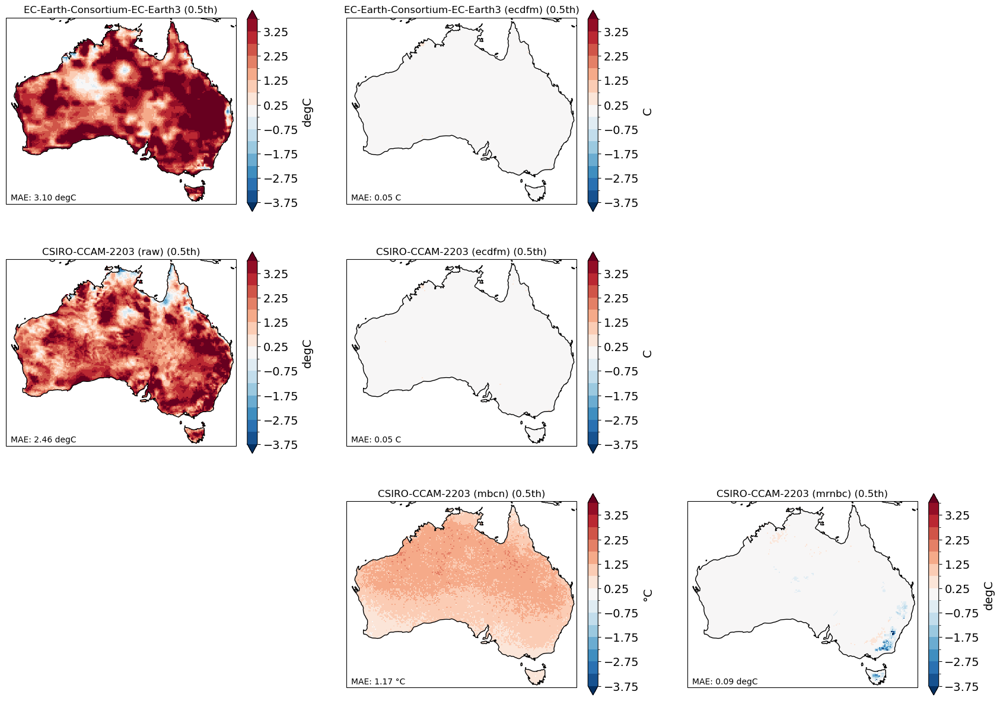

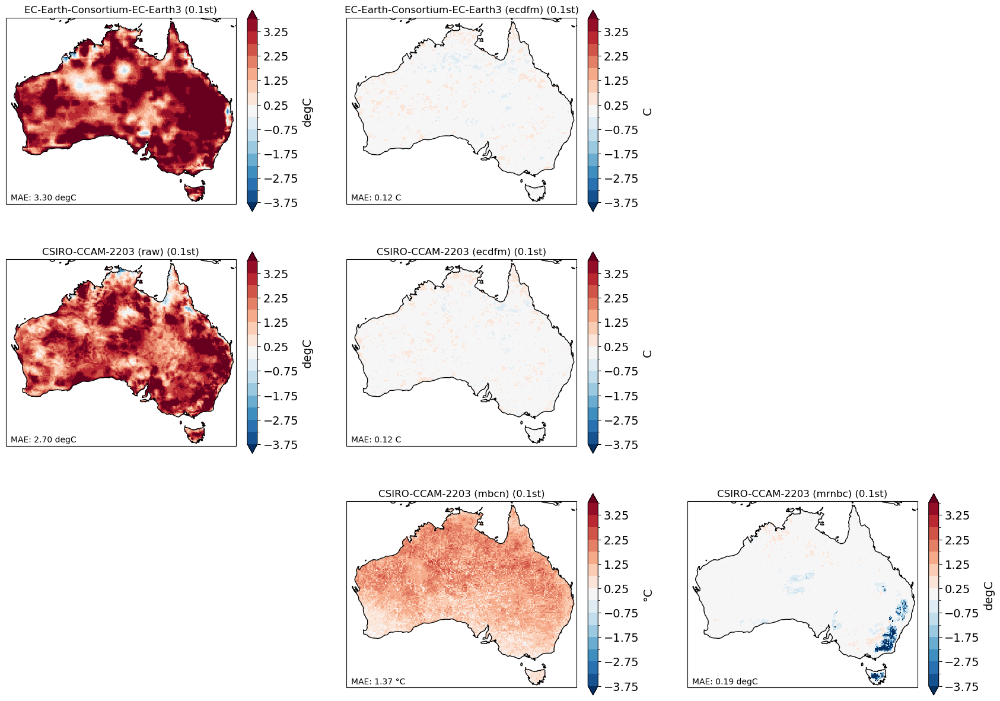

In [17]:
rcm = 'CSIRO-CCAM-2203'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date)

# task-xvalidation

### ACCESS-ESM1-5
Bias corrected data for the 1990-2019 period, using 1960-1989 as a training period.

In [18]:
gcm = 'CSIRO-ACCESS-ESM1-5'
task = 'xvalidation'
start_date, end_date = get_assessment_time_bounds(gcm, task)
da_obs = get_obs_data(variable, start_date, end_date)
da_gcm = get_gcm_data(variable, gcm, start_date, end_date)
gcm_bc_dict = get_bias_corrected_gcm_data(variable, gcm, task, start_date, end_date)

training_start, training_end = get_training_time_bounds(gcm)
da_training_obs = get_obs_data(variable, training_start, training_end)

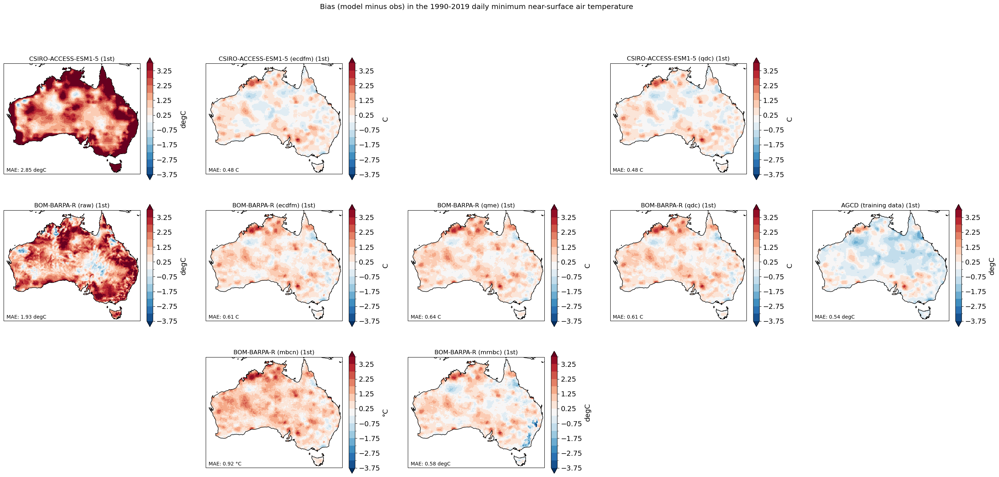

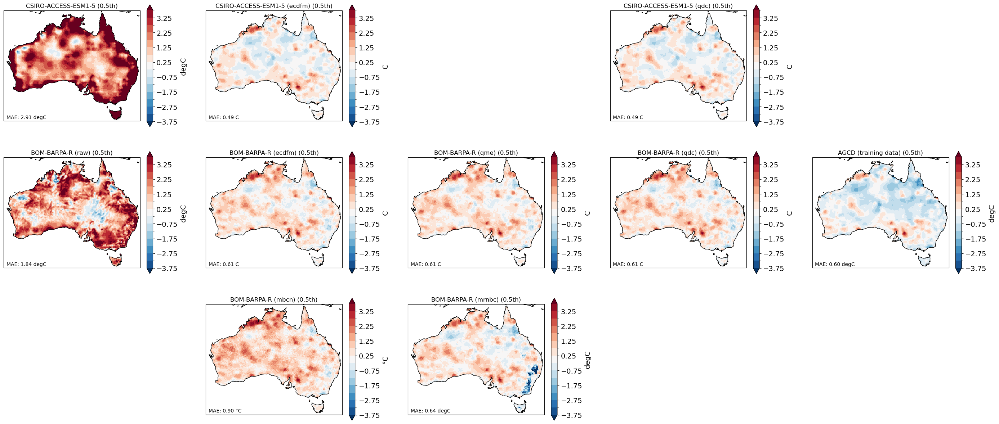

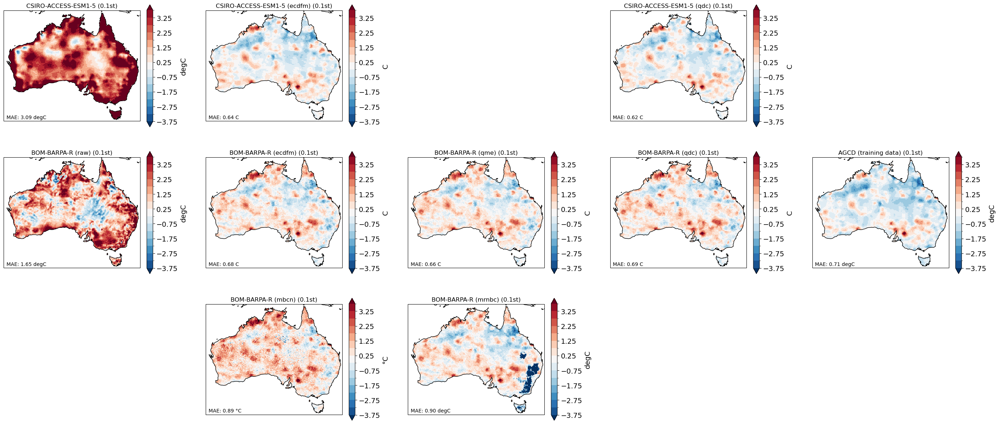

In [19]:
rcm = 'BOM-BARPA-R'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date, da_training_obs, save_outfile=False)

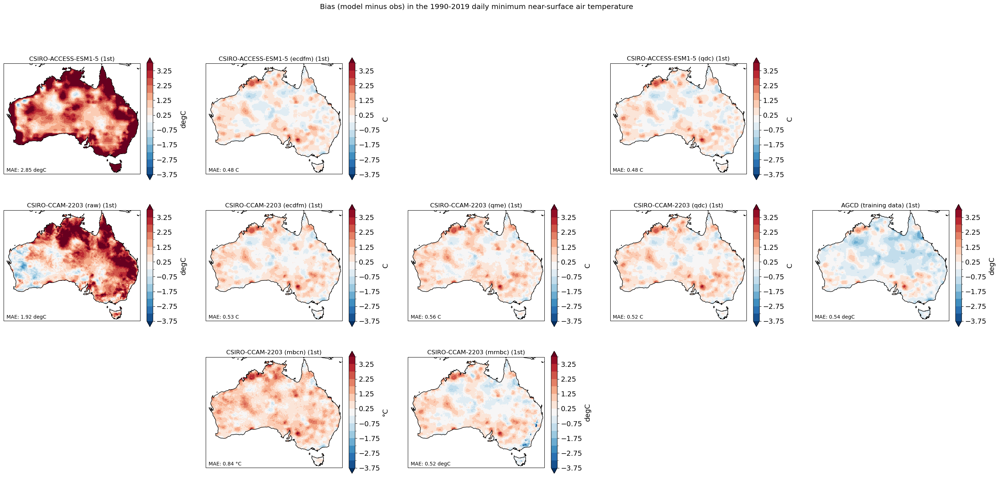

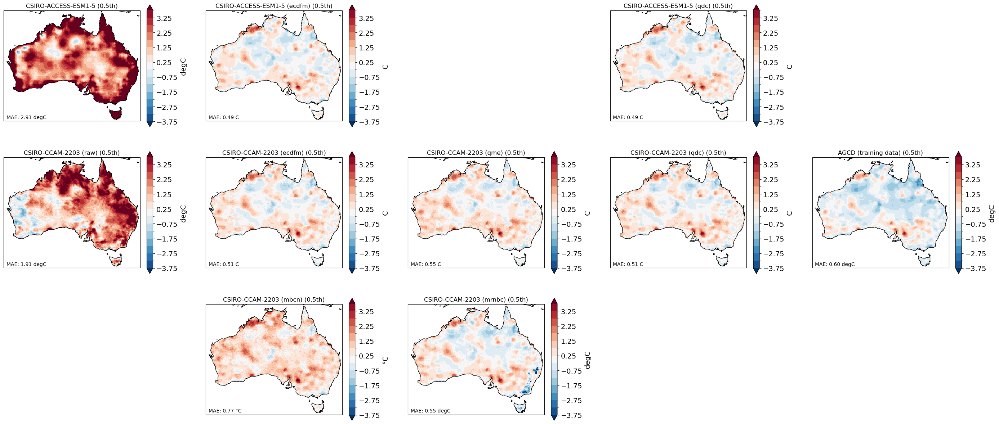

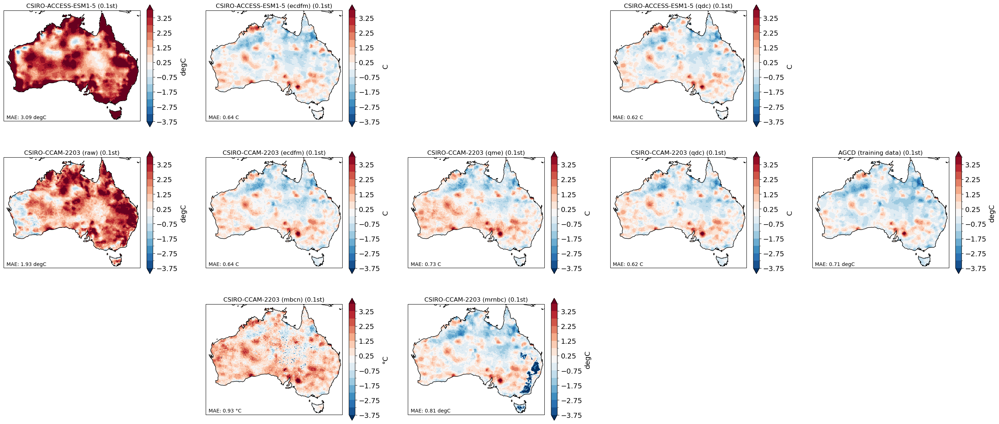

In [20]:
rcm = 'CSIRO-CCAM-2203'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date, da_training_obs, save_outfile=False)

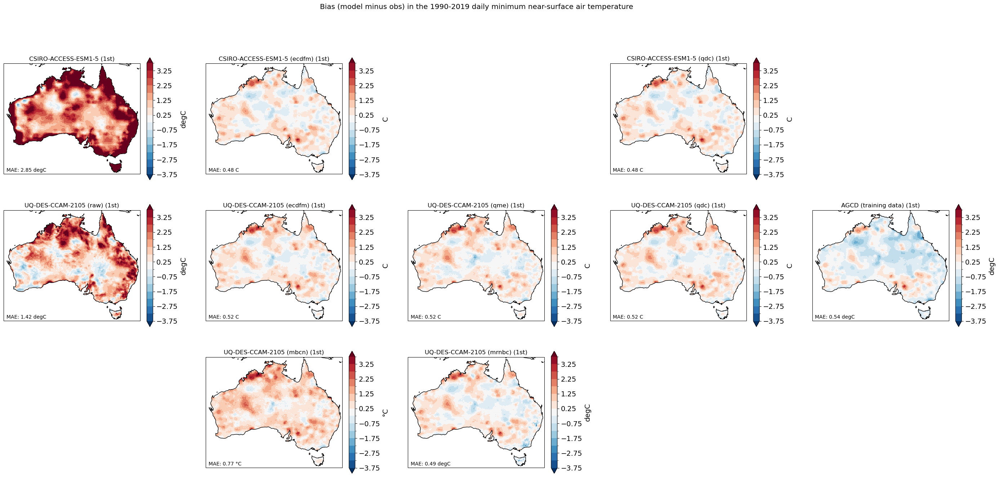

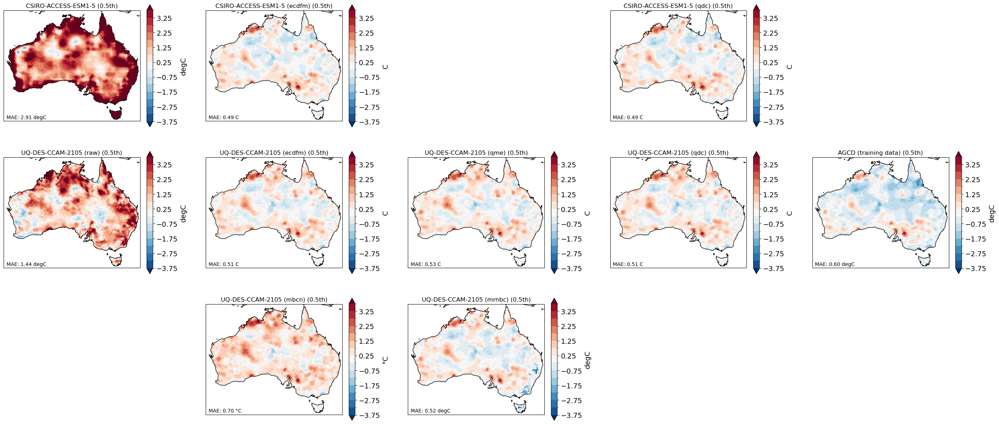

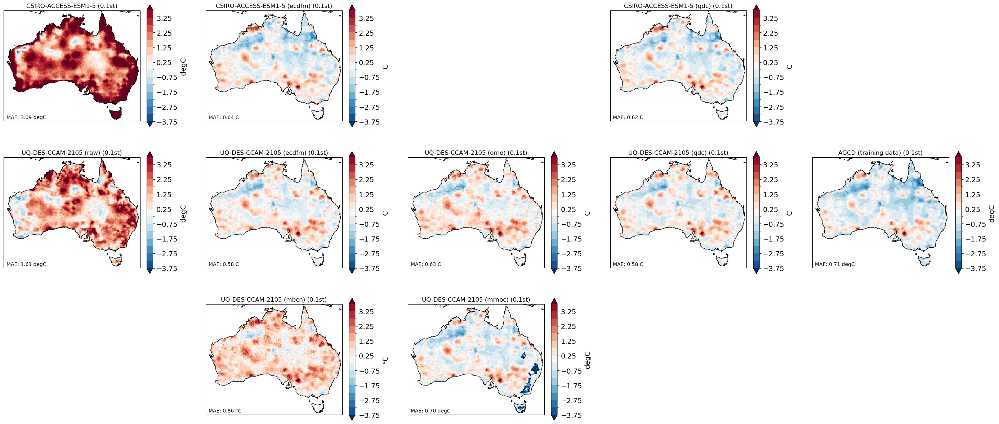

In [21]:
rcm = 'UQ-DES-CCAM-2105'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date, da_training_obs, save_outfile=False)

#### CESM2

In [22]:
gcm = 'NCAR-CESM2'
task = 'xvalidation'
start_date, end_date = get_assessment_time_bounds(gcm, task)
da_obs = get_obs_data(variable, start_date, end_date)
da_gcm = get_gcm_data(variable, gcm, start_date, end_date)
gcm_bc_dict = get_bias_corrected_gcm_data(variable, gcm, task, start_date, end_date)

training_start, training_end = get_training_time_bounds(gcm)
da_training_obs = get_obs_data(variable, training_start, training_end)

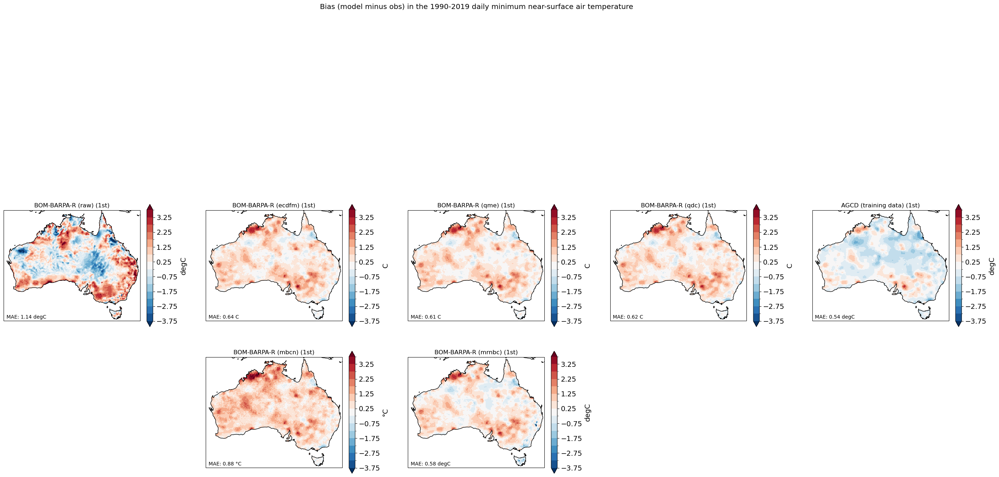

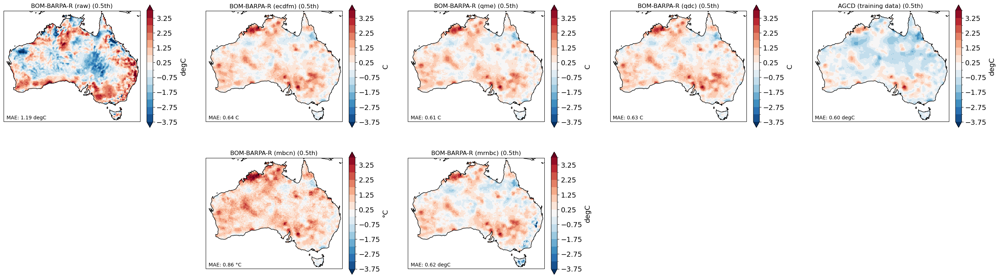

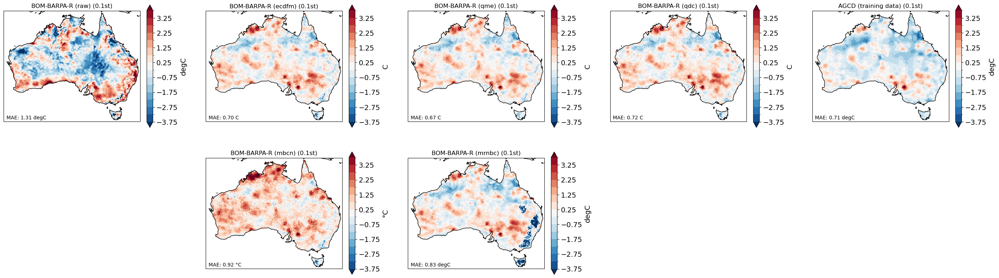

In [23]:
rcm = 'BOM-BARPA-R'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date, da_training_obs)

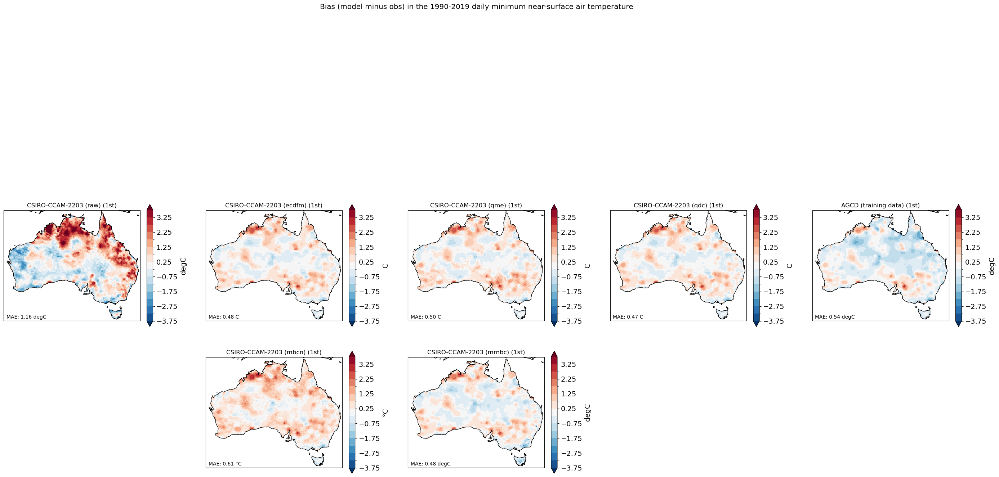

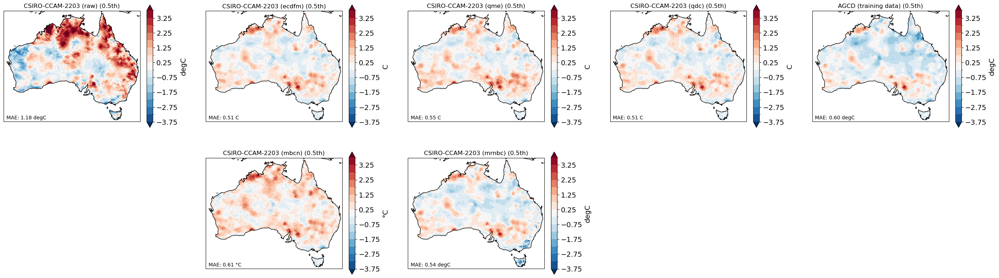

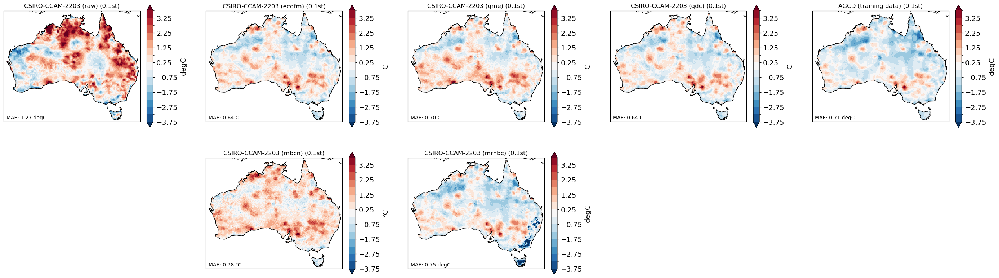

In [24]:
rcm = 'CSIRO-CCAM-2203'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date, da_training_obs)

#### EC-Earth3

In [25]:
gcm = 'EC-Earth-Consortium-EC-Earth3'
task = 'xvalidation'
start_date, end_date = get_assessment_time_bounds(gcm, task)
da_obs = get_obs_data(variable, start_date, end_date)
da_gcm = get_gcm_data(variable, gcm, start_date, end_date)
gcm_bc_dict = get_bias_corrected_gcm_data(variable, gcm, task, start_date, end_date)

training_start, training_end = get_training_time_bounds(gcm)
da_training_obs = get_obs_data(variable, training_start, training_end)

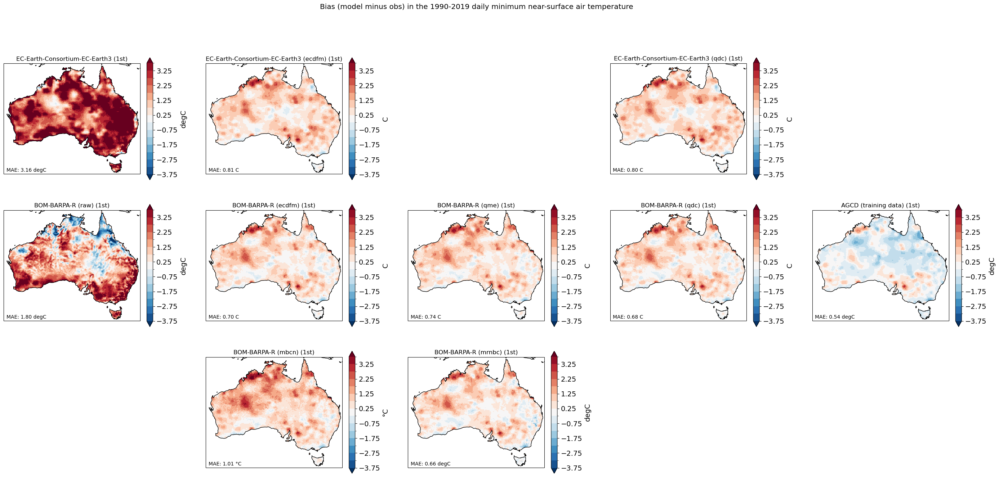

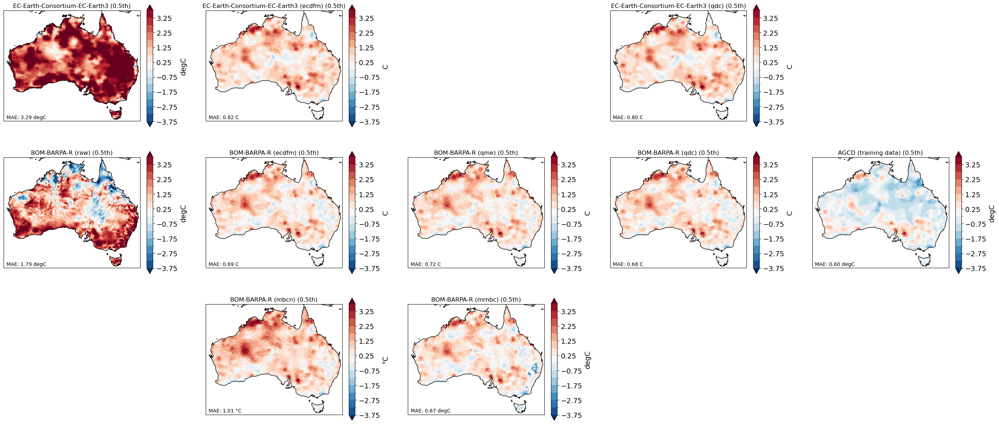

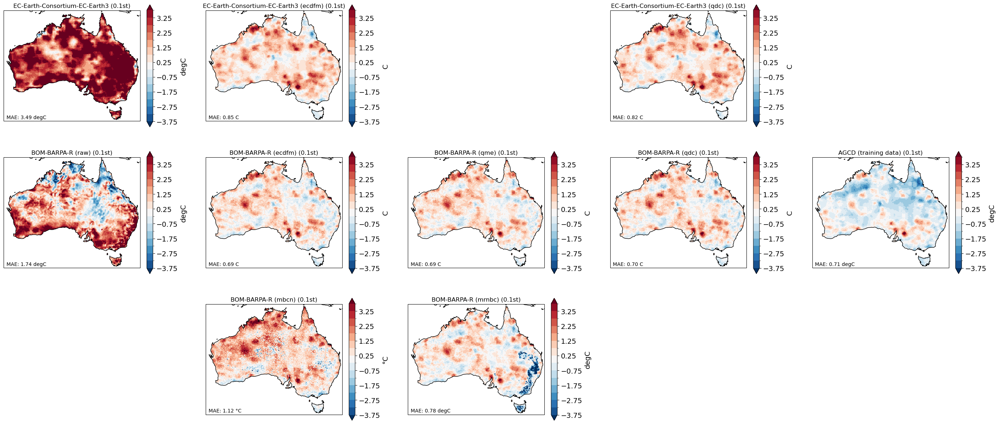

In [26]:
rcm = 'BOM-BARPA-R'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date, da_training_obs)

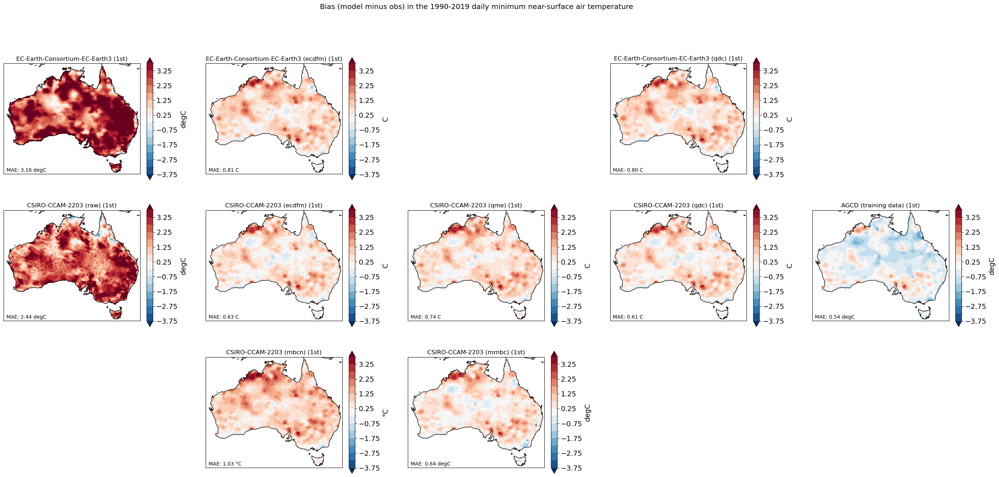

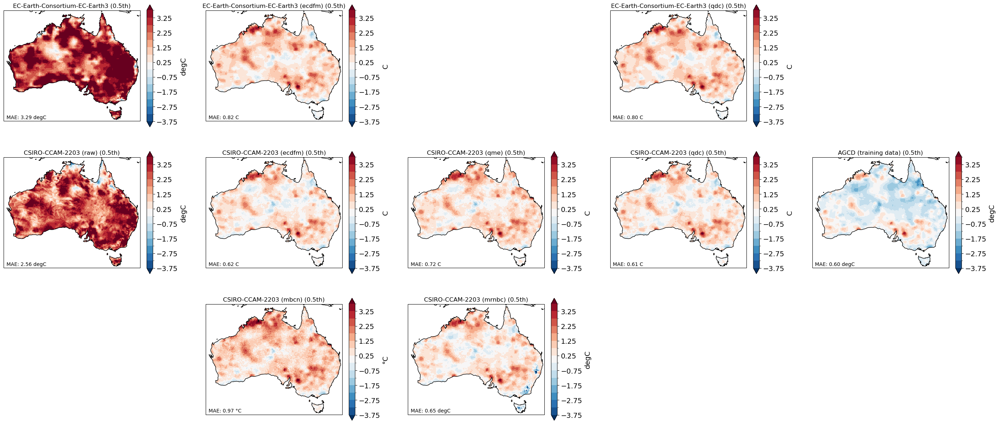

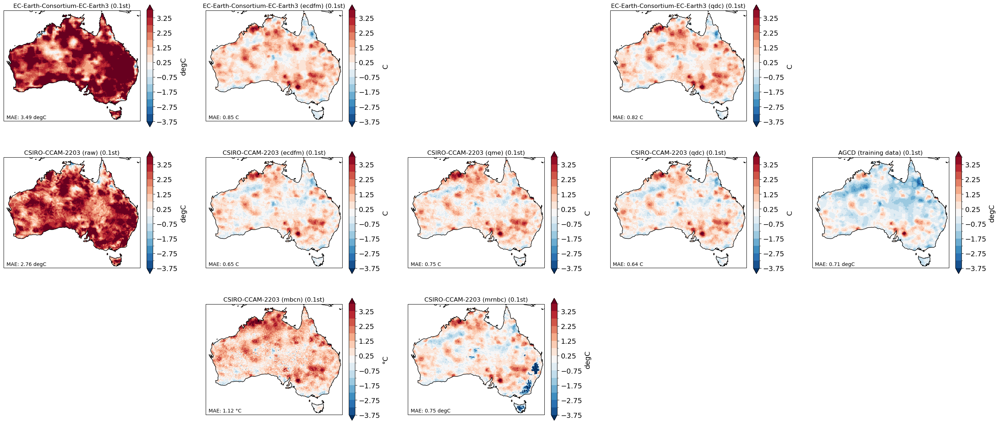

In [27]:
rcm = 'CSIRO-CCAM-2203'
plot_rcm(da_obs, da_gcm, gcm_bc_dict, variable, gcm, rcm, task, start_date, end_date, da_training_obs)